In [148]:
import numpy as np
import matplotlib.pyplot as plt
import time

In [149]:
n = 21
cities = [i for i in range(n)] # список номеров городов
roads = [(i, j) for i in range(n) for j in range(n) if(i != j)] # это попарные маршруты между всеми городами

N = [i for i in range(1, n)] # tour без депо

min_capasity = 1
max_capasity = 42
max_vehicle = 30
capacity = np.minimum(np.maximum(np.abs(np.random.normal(15, 10, size=[1, n])), min_capasity), max_capasity)

p = 1
max_vehicle *= p
while(max_vehicle < max_capasity):
    max_vehicle = max_vehicle / p
    p += 1
    max_vehicle *= p
print("Используется грузовиков: ", p)

q = {i: capacity[0][i] for i in N} # вес груза, который необходимо перевести в город
print(q)

Используется грузовиков:  2
{1: 3.1114074221597114, 2: 9.931836457013125, 3: 9.036859615494919, 4: 14.474327037304537, 5: 4.362798058465071, 6: 16.887785967938285, 7: 20.238910238342058, 8: 15.884220870446613, 9: 11.891138283015284, 10: 15.974001662687835, 11: 18.9904634564013, 12: 12.725927564266502, 13: 34.55912308250694, 14: 18.900933226879264, 15: 8.4759141761298, 16: 11.090466248123988, 17: 19.937417773491884, 18: 13.838960609656334, 19: 5.306844677814944, 20: 35.644928613593194}


In [150]:
# Создаем рандомно координаты городов в диапозоне от 0 до 100
#np.random.seed(0) # ПОЗЖЕ УБРАТЬ ЕГО,ИНАЧЕ РЕШАЕМ ОДНУ И ТУ ЖЕ ЗАДАЧУ
x = np.random.rand(n) * 100
y = np.random.rand(n) * 100

In [151]:
distance = {(i,j):np.hypot(x[i] - x[j], y[i]-y[j]) for i,j in roads}

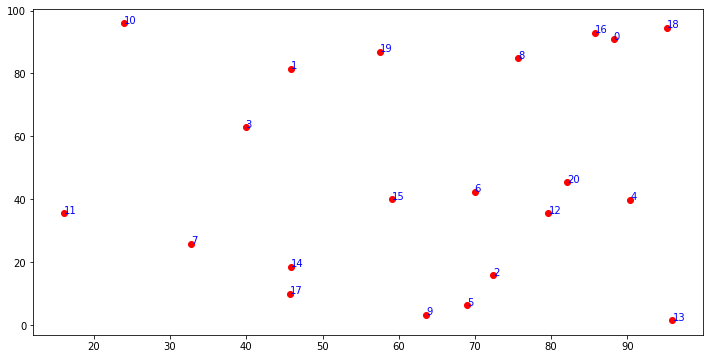

In [152]:
plt.figure(figsize = (12,6))
plt.scatter(x, y, color = 'red')

# Нумирем все города
for n in range(len(x)):
    plt.annotate(str(n), xy = (x[n], y[n]), xytext = (x[n], y[n]), color = 'blue')

plt.show()

In [153]:
#!!!!!! Позже добавить учет объема грузовиков

#Реализация метода ближайшего соседа

# узел == город
def Nearest_Neighbour(starting_node, cities, distance):
    #Поставим стартовый узел и добавим его в список узлов
    NN = [starting_node]
    n = len(cities)
    
    while(len(NN) < n):
        k = NN[-1] # берём последний узел
        # считаем от этого узла расстояние до всевозможных остальных узлов и берем минимальное
        nn = {(k,j): distance[(k, j)] for j in cities if((k!=j) and (j not in NN))}
        new = min(nn.items(), key = lambda x: x[1]) # находим минимальное расстояние до узла
        NN.append(new[0][1]) # запоминае новый узел
    
    NN.append(starting_node)
    
    return NN

# По итогу получаем оптимальный маршрут через все города, НО он может быть с пересчениями

In [154]:
# Вычисление длины всего маршрута
# lst - список городов
def total_distance(lst, distance):
    dist = 0
    for n in range(len(lst) - 1):
        i = lst[n]
        j = lst[n + 1]
        dist = dist + distance[(i, j)]
    return dist

# 2-Opt

In [155]:
# Создадим начальное решение с помощью NN, которое далее будем улучшать
starting_node = 0
NN = Nearest_Neighbour(starting_node, cities, distance)

print(NN)

[0, 16, 18, 8, 19, 1, 3, 15, 6, 12, 20, 4, 2, 5, 9, 17, 14, 7, 11, 10, 13, 0]


In [156]:
# Считаем общее расстояние для начального маршрута, который получили выше
d = total_distance(NN, distance)
d

535.183980128799

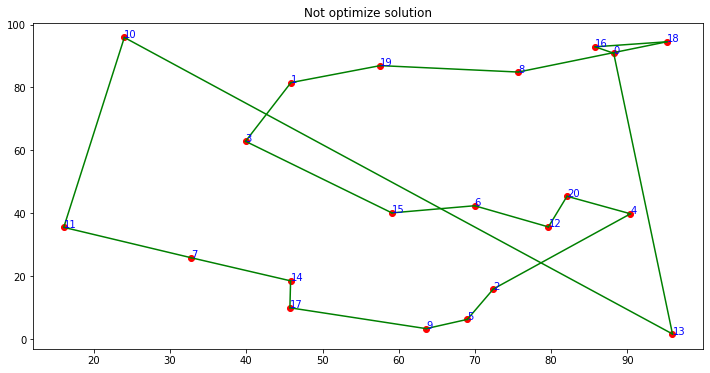

In [157]:
plt.figure(figsize = (12,6))
plt.scatter(x, y, color = 'red')

# Нумирем все города
for n in range(len(x)):
    plt.annotate(str(n), xy = (x[n], y[n]), xytext = (x[n], y[n]), color = 'blue')

for n in range(len(NN) - 1):
    plt.plot([x[NN[n]], x[NN[n + 1]]], [y[NN[n]], y[NN[n + 1]]], color = 'green')

plt.title("Not optimize solution")
plt.show()

In [158]:
#Реализация функции 2-Opt
def Two_Opt(NN, distance):
    min_change = 0
    for i in range(len(NN) - 2):
        for j in range(i+2, len(NN)-1):
            print("NN[k][i]:", NN[i])
            print("NN[k][i+1]:", NN[i+1])
            print("NN[k][j]:", NN[j])
            print("NN[k][j+1]:", NN[j+1])
            cost_actual = distance[(NN[i], NN[i+1])] + distance[(NN[j], NN[j+1])]
            #Убираем 2 ребра и вставляем 2 новых
#             print("cost_actual", cost_actual)
            cost_new = distance[(NN[i], NN[j])] + distance[(NN[i+1], NN[j+1])]
#             print("cost_new", cost_new)
            #Далее проверяем улучшился маршрут после перестановки или нет
            change = cost_new - cost_actual
            if(change < min_change):
                min_change = change
                #Также запомни индексы, на которых при перестановки маршрут улучшился
                min_i = i
                min_j = j
                
    if(min_change < 0):
         NN[min_i+1:min_j+1] = NN[min_i+1:min_j+1][::-1] # переворачиваем целый список городов
    return NN

In [159]:
time_start = time.time()
solution = NN.copy()
print("Start solution", solution)
flag = 1 
k = 0 # кол-во шагов
print("Start distance", total_distance(solution, distance))
while(flag != 0):
    k += 1
    d_start = total_distance(solution, distance)
    solution = Two_Opt(solution, distance).copy()
    final = total_distance(solution, distance)
    
    flag = np.abs(final - d_start)

time_final = time.time()

print("Optimize solution", solution)
print("Optimize distance", final)
print("Work time", time_final - time_start)
print("Steps", k)

Start solution [0, 16, 18, 8, 19, 1, 3, 15, 6, 12, 20, 4, 2, 5, 9, 17, 14, 7, 11, 10, 13, 0]
Start distance 535.183980128799
NN[k][i]: 0
NN[k][i+1]: 16
NN[k][j]: 18
NN[k][j+1]: 8
NN[k][i]: 0
NN[k][i+1]: 16
NN[k][j]: 8
NN[k][j+1]: 19
NN[k][i]: 0
NN[k][i+1]: 16
NN[k][j]: 19
NN[k][j+1]: 1
NN[k][i]: 0
NN[k][i+1]: 16
NN[k][j]: 1
NN[k][j+1]: 3
NN[k][i]: 0
NN[k][i+1]: 16
NN[k][j]: 3
NN[k][j+1]: 15
NN[k][i]: 0
NN[k][i+1]: 16
NN[k][j]: 15
NN[k][j+1]: 6
NN[k][i]: 0
NN[k][i+1]: 16
NN[k][j]: 6
NN[k][j+1]: 12
NN[k][i]: 0
NN[k][i+1]: 16
NN[k][j]: 12
NN[k][j+1]: 20
NN[k][i]: 0
NN[k][i+1]: 16
NN[k][j]: 20
NN[k][j+1]: 4
NN[k][i]: 0
NN[k][i+1]: 16
NN[k][j]: 4
NN[k][j+1]: 2
NN[k][i]: 0
NN[k][i+1]: 16
NN[k][j]: 2
NN[k][j+1]: 5
NN[k][i]: 0
NN[k][i+1]: 16
NN[k][j]: 5
NN[k][j+1]: 9
NN[k][i]: 0
NN[k][i+1]: 16
NN[k][j]: 9
NN[k][j+1]: 17
NN[k][i]: 0
NN[k][i+1]: 16
NN[k][j]: 17
NN[k][j+1]: 14
NN[k][i]: 0
NN[k][i+1]: 16
NN[k][j]: 14
NN[k][j+1]: 7
NN[k][i]: 0
NN[k][i+1]: 16
NN[k][j]: 7
NN[k][j+1]: 11
NN[k][i]: 0
N

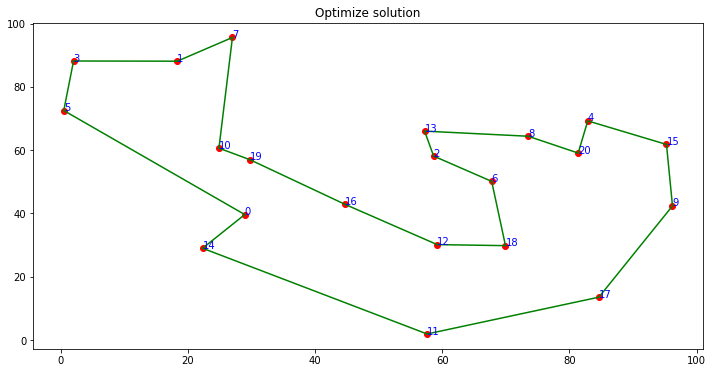

In [141]:
plt.figure(figsize = (12,6))
plt.scatter(x, y, color = 'red')

# Нумирем все города
for n in range(len(x)):
    plt.annotate(str(n), xy = (x[n], y[n]), xytext = (x[n], y[n]), color = 'blue')

for n in range(len(NN) - 1):
    plt.plot([x[solution[n]], x[solution[n + 1]]], [y[solution[n]], y[solution[n + 1]]], color = 'green')

plt.title("Optimize solution")
plt.show()

# 2-Opt and 3-Opt CVRP

In [609]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import operator
from functools import reduce
import itertools

# Получаем список городов, на которых суммарный вес превышает вместимость грузовика
def subtourslice(tour, vehicle, max_vehicle):
    #print("--------------------------------Начало работы функции--------------------------------")
    #vehilce[i][0] - номер города, vehicle[i][1] - вес груза для перевозки
    capacity_used = np.zeros(len(vehicle))
    k = 0
    slice = []
    mass = [] # список всех весов грузов для перевозки
    for i in range(len(vehicle)):
        # capacity_used[i] - начальный вес
        while((capacity_used[i] <= max_vehicle) and (vehicle[k][0] <= (len(tour) - 3))):
            capacity_used[i] += vehicle[k][1] # заполняем грузовик конкретным кол-вом груза для каждого города
            if(capacity_used[i] > max_vehicle):
                # если кол-во груза, который нужно отвезти, больше чем вместимость грузовика, то вычитаем это кол-во груза
                capacity_used[i] -= vehicle[k][1]
                slice.append(vehicle[k-1][0]) # запоминаем номер тура, чтобы повторно не проходить по такому же маршруту
                break
            k += 1
        mass.append(capacity_used[i])
    slice.append(vehicle[k-1][0])
    return(slice, mass)

def subtour(slice, tour):
    sub = []
    # добавляем номера городов, после которых суммарный вес груза превышал объем грузовика
    sub.append(tour[:(slice[0] + 1)])
    for i in range(0, len(slice) - 1):
        # нарежем маршруты городов до момента, пока суммарный вес груза не превысел объем грузовика
        sub.append(tour[(slice[i] + 1):(slice[i + 1] + 1)])
    return sub

def total_distance(lst, distance):
    d = 0
    if(len(lst) == 1):
        d = d + distance[(0, lst[0])]
        return d

    for n in range(1, len(lst)-1):
        i = lst[n]
        j = lst[n+1]
        d = d + distance[(i, j)]
    
    d = d + distance[(0, len(lst) - 1)]
    
    if(lst[0] == 0):
        d = d + distance[(0, lst[1])]
    else:
        d = d + distance[(0, lst[0])]
    return d

def Nearest_Neighbour(starting_node, cities, distance, q, max_vehicle):
    #Поставим стартовый узел и добавим его в список узлов
    NN = [starting_node]
    n = len(cities)
    
    while(len(NN) < n):
        k = NN[-1] # берём последний узел
        # считаем от этого узла расстояние до всевозможных остальных узлов и берем минимальное
        nn = {(k,j): distance[(k, j)] for j in cities if((k!=j) and (j not in NN))}
        new = min(nn.items(), key = lambda x: x[1]) # находим минимальное расстояние до узла
        NN.append(new[0][1]) # запоминае новый узел
    
    NN.append(starting_node)
    print("NN", NN)
    lst_NN, _ = subtourslice(NN, q, max_vehicle)
    print("lst_NN", lst_NN)
    all_lst_NN = subtour(lst_NN, NN)
    return all_lst_NN

def Two_Opt(NN, distance):
    for k in range(len(NN)):
        min_change = 0
        change = 0
        min_i = 0
        min_j = 0
        for i in range(len(NN[k]) - 2):
            for j in range(i+2, len(NN[k])-1):
                cost_actual = distance[(NN[k][i], NN[k][i+1])] + distance[(NN[k][j], NN[k][j+1])]
                #Убираем 2 ребра и вставляем 2 новых
                cost_new = distance[(NN[k][i], NN[k][j])] + distance[(NN[k][i+1], NN[k][j+1])]
                #Далее проверяем улучшился маршрут после перестановки или нет
                change = cost_new - cost_actual
                if(change < min_change):
                    min_change = change
                    #Также запомни индексы, на которых при перестановки маршрут улучшился
                    min_i = i
                    min_j = j

        if(min_change < 0):
             NN[k][min_i+1:min_j+1] = NN[k][min_i+1:min_j+1][::-1] # переворачиваем целый список городов
    return NN

def reverse_segment_if_better(tour, i, j, k, distance):
    """If reversing tour[i:j] would make the tour shorter, then do it."""
    # Given tour [...A-B...C-D...E-F...]
    A, B, C, D, E, F = tour[i-1], tour[i], tour[j-1], tour[j], tour[k-1], tour[k % len(tour)]
    d0 = distance[(A, B)] + distance[(C, D)] + distance[(E, F)]
    d1 = distance[(A, C)] + distance[(B, D)] + distance[(E, F)] # 2
    d2 = distance[(A, B)] + distance[(C, E)] + distance[(D, F)] # 1
    d3 = distance[(A, D)] + distance[(E, B)] + distance[(C, F)] # 4
    d4 = distance[(F, B)] + distance[(C, D)] + distance[(E, A)] # 0

    if d0 > d1:
        tour[i:j] = reversed(tour[i:j])
        return -d0 + d1
    elif d0 > d2:
        tour[j:k] = reversed(tour[j:k])
        return -d0 + d2
    elif d0 > d4:
        tour[i:k] = reversed(tour[i:k])
        return -d0 + d4
    elif d0 > d3:
        tmp = tour[j:k] + tour[i:j]
        tour[i:k] = tmp
        return -d0 + d3
    return 0

def all_segments(n: int):
    """Generate all segments combinations"""
    return ((i, j, k)
        for i in range(n - 5)
        for j in range(i + 2, n - 3)
        for k in range(j + 2, n - 1))

def three_opt(tour, distance):
    """Iterative improvement based on 3 exchange."""
    p = 0
    while True:
        delta = 0
        if(p >= len(tour)):
            break
        for (a, b, c) in all_segments(len(tour[p])):
            delta += reverse_segment_if_better(tour[p], a, b, c, distance)
        if delta >= 0:
            p += 1
    return tour

In [617]:
n = 101
cities = [i for i in range(n)] # список номеров городов

roads = [(i, j) for i in range(n) for j in range(n) if(i != j)] # это попарные маршруты между всеми городами

# np.random.seed(0)
x = np.random.rand(n) * 10
y = np.random.rand(n) * 10


distance = {(i,j):np.hypot(x[i] - x[j], y[i]-y[j]) for i,j in roads}

N = [i for i in range(1, n)] # tour без депо

min_capasity = 1
max_capasity = 42
max_vehicle = 50
capacity = np.minimum(np.maximum(np.abs(np.random.normal(15, 10, size=[1, n])), min_capasity), max_capasity)

p = 1
max_vehicle *= p
while(max_vehicle < max_capasity):
    max_vehicle = max_vehicle / p
    p += 1
    max_vehicle *= p
print("Используется грузовиков: ", p)

q = []
for i in range(1, len(N)+1):
    q.append((i, capacity[0][i])) # вес груза, который необходимо перевести в город

time_start = time.time()

starting_node = 0
NN = Nearest_Neighbour(starting_node, cities, distance, q, max_vehicle) # Создаем начальный тур, который уже каким-то образом оптимизирован
solution1 = NN.copy()
print("Start solution", NN)

flag = 1 
k1 = 0 # кол-во шагов
print("Start distance", reduce(operator.add, (total_distance(x, distance) for x in solution1), 0))
while(flag != 0):
    k1 += 1
    d_start1 = reduce(operator.add, (total_distance(x, distance) for x in solution1), 0)
    #print("start", d_start)
    solution1 = Two_Opt(solution1, distance).copy()
    #print("solution_two_opt", solution1)
    final1 = reduce(operator.add, (total_distance(x, distance) for x in solution1), 0)
    flag = np.abs(final1 - d_start1)
    print(final1)

flag = 1 
k2 = 0 # кол-во шагов
solution2 = NN.copy()
while(flag != 0):
    k2 += 1
    d_start2 = reduce(operator.add, (total_distance(x, distance) for x in solution2), 0)
    #print("start", d_start)
    solution2 = three_opt(solution2, distance).copy()
    #print("solution_three_opt", solution2)
    final2 = reduce(operator.add, (total_distance(x, distance) for x in solution2), 0)
    flag = np.abs(final2 - d_start2)

time_final = time.time()

print(" ")
print("Result Two-Opt")
print("Optimize solution", solution1)
print("Optimize distance", final1)
print("Steps", k1)
print(" ")
print("Result Three-Opt")
print("Optimize solution", solution2)
print("Optimize distance", final2)
#print("Work time", time_final - time_start)
print("Steps", k2)

Используется грузовиков:  1
NN [0, 74, 49, 9, 11, 61, 52, 46, 23, 86, 62, 18, 2, 5, 1, 24, 14, 40, 56, 84, 34, 65, 81, 17, 39, 68, 95, 90, 58, 77, 41, 6, 7, 47, 33, 88, 48, 3, 72, 98, 35, 25, 44, 8, 12, 60, 36, 89, 94, 70, 13, 92, 97, 75, 67, 53, 69, 55, 78, 66, 45, 87, 15, 57, 42, 51, 38, 99, 82, 30, 31, 83, 32, 64, 73, 28, 19, 22, 21, 80, 43, 93, 85, 100, 76, 54, 10, 96, 29, 59, 37, 4, 91, 63, 79, 27, 16, 26, 50, 71, 20, 0]
lst_NN [2, 5, 8, 12, 13, 16, 18, 21, 22, 26, 29, 30, 31, 34, 37, 40, 43, 46, 48, 50, 51, 53, 56, 59, 61, 63, 64, 66, 70, 72, 74, 77, 81, 83, 85, 88, 91, 93, 95, 99]
Start solution [[0, 74, 49], [9, 11, 61], [52, 46, 23], [86, 62, 18, 2], [5], [1, 24, 14], [40, 56], [84, 34, 65], [81], [17, 39, 68, 95], [90, 58, 77], [41], [6], [7, 47, 33], [88, 48, 3], [72, 98, 35], [25, 44, 8], [12, 60, 36], [89, 94], [70, 13], [92], [97, 75], [67, 53, 69], [55, 78, 66], [45, 87], [15, 57], [42], [51, 38], [99, 82, 30, 31], [83, 32], [64, 73], [28, 19, 22], [21, 80, 43, 93], [85,

In [554]:
combine_subtour = np.concatenate([list(itertools.chain(x, [len(cities)])) for x in solution1])
combine_subtour = np.append([len(cities)],combine_subtour)

plt.figure(figsize = (7, 7))
plt.scatter([nodes[combine_subtour[i]][0] for i in range(0, len(combine_subtour))], [nodes[combine_subtour[i]][1] for i in range(0, len(combine_subtour))], c = 'b')
plt.plot([nodes[combine_subtour[i]][0] for i in range(0, len(combine_subtour))], [nodes[combine_subtour[i]][1] for i in range(0, len(combine_subtour))], c = 'g')
plt.scatter(nodes[combine_subtour[0]][0],nodes[combine_subtour[0]][1], color='red', s=500, marker='o')
for i in range(len(combine_subtour)):
    plt.annotate(combine_subtour[i], xy = (nodes[combine_subtour[i]][0], nodes[combine_subtour[i]][1]))
plt.show()

IndexError: index 101 is out of bounds for axis 0 with size 101

<Figure size 504x504 with 0 Axes>

In [ ]:
name_file = "data node VRP.xlsx"
xlsx = pd.ExcelFile(name_file)
sheet = pd.read_excel(xlsx, 'Sheet100')
sheet_vehicle = pd.read_excel(xlsx, 'Sheet_vehicle')

# Описываем данные
nodes = sheet.values
depot = nodes[len(nodes) - 1] # координаты и количество товара в депо
cities = nodes[:(len(nodes) - 1)] # координаты и количество товара в остальных вершин(городов)
vehicle = sheet_vehicle.values # первая колонка отвечает за номер траспортного средства
                        # вторая колонка это максимальная вместимость
n = len(nodes) - 1

cities_number = [i for i in range(n)] # список номеров городов

roads = [(i, j) for i in range(n) for j in range(n) if(i != j)] # это попарные маршруты между всеми городами

distance = {(i,j):np.hypot(cities[i][0] - cities[j][0], cities[i][1] - cities[j][1]) for i,j in roads}

N = [i for i in range(1, n)] # tour без депо

q = []
for i in range(1, len(N)+1):
    q.append((i, cities[i][2])) # вес груза, который необходимо перевести в город

time_start = time.time()

max_vehicle = vehicle[1][1]
starting_node = 0
NN = Nearest_Neighbour(starting_node, cities_number, distance, q, max_vehicle) # Создаем начальный тур, который уже каким-то образом оптимизирован
solution = NN.copy()
print("Start solution", solution)

flag = 1 
k = 0 # кол-во шагов
print("Start distance", reduce(operator.add, (total_distance(x, distance) for x in solution), 0))
while(flag != 0):
    k += 1
    d_start = reduce(operator.add, (total_distance(x, distance) for x in solution), 0)
    solution = three_opt(solution, distance).copy()
    final = reduce(operator.add, (total_distance(x, distance) for x in solution), 0)
    
    flag = np.abs(final - d_start)

time_final = time.time()

print("Optimize solution", solution)
print("Optimize distance", final)
print("Work time", time_final - time_start)
print("Steps", k)

In [606]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import operator
from functools import reduce
import itertools

# Получаем список городов, на которых суммарный вес превышает вместимость грузовика
def subtourslice(tour, vehicle, max_vehicle):
    #print("--------------------------------Начало работы функции--------------------------------")
    #vehilce[i][0] - номер города, vehicle[i][1] - вес груза для перевозки
    capacity_used = np.zeros(len(vehicle))
    k = 0
    slice = []
    mass = [] # список всех весов грузов для перевозки
    for i in range(len(vehicle)):
        # capacity_used[i] - начальный вес
        while((capacity_used[i] <= max_vehicle) and (vehicle[k][0] <= (len(tour) - 3))):
            capacity_used[i] += vehicle[k][1] # заполняем грузовик конкретным кол-вом груза для каждого города
            if(capacity_used[i] > max_vehicle):
                # если кол-во груза, который нужно отвезти, больше чем вместимость грузовика, то вычитаем это кол-во груза
                capacity_used[i] -= vehicle[k][1]
                slice.append(vehicle[k-1][0]) # запоминаем номер тура, чтобы повторно не проходить по такому же маршруту
                break
            k += 1
        mass.append(capacity_used[i])
    slice.append(vehicle[k-1][0])
    return(slice, mass)

def subtour(slice, tour):
    sub = []
    # добавляем номера городов, после которых суммарный вес груза превышал объем грузовика
    sub.append(tour[:(slice[0] + 1)])
    for i in range(0, len(slice) - 1):
        # нарежем маршруты городов до момента, пока суммарный вес груза не превысел объем грузовика
        sub.append(tour[(slice[i] + 1):(slice[i + 1] + 1)])
    return sub

def total_distance(lst, distance):
    d = 0
    for n in range(1, len(lst)-1):
        i = lst[n]
        j = lst[n+1]
        d = d + distance[(i, j)]
    return d

def Nearest_Neighbour(starting_node, cities, distance):
    #Поставим стартовый узел и добавим его в список узлов
    NN = [starting_node]
    n = len(cities)
    
    while(len(NN) < n):
        k = NN[-1] # берём последний узел
        # считаем от этого узла расстояние до всевозможных остальных узлов и берем минимальное
        nn = {(k,j): distance[(k, j)] for j in cities if((k!=j) and (j not in NN))}
        new = min(nn.items(), key = lambda x: x[1]) # находим минимальное расстояние до узла
        NN.append(new[0][1]) # запоминае новый узел
    
    NN.append(starting_node)
    return NN

def Two_Opt(NN, distance):
    min_change = 0
    change = 0
    min_i = 0
    min_j = 0
    for i in range(len(NN) - 2):
        for j in range(i+2, len(NN)-1):
            cost_actual = distance[(NN[i], NN[i+1])] + distance[(NN[j], NN[j+1])]
            #Убираем 2 ребра и вставляем 2 новых
            cost_new = distance[(NN[i], NN[j])] + distance[(NN[i+1], NN[j+1])]
            #Далее проверяем улучшился маршрут после перестановки или нет
            change = cost_new - cost_actual
            if(change < min_change):
                min_change = change
                #Также запомни индексы, на которых при перестановки маршрут улучшился
                min_i = i
                min_j = j

    if(min_change < 0):
         NN[min_i+1:min_j+1] = NN[min_i+1:min_j+1][::-1] # переворачиваем целый список городов
    return NN

def reverse_segment_if_better(tour, i, j, k, distance):
    """If reversing tour[i:j] would make the tour shorter, then do it."""
    # Given tour [...A-B...C-D...E-F...]
    A, B, C, D, E, F = tour[i-1], tour[i], tour[j-1], tour[j], tour[k-1], tour[k % len(tour)]
    print(A, B, C, D, E, F)
    if(A == B):
        distance[(A, B)] = 0
    d0 = distance[(A, B)] + distance[(C, D)] + distance[(E, F)]
    d1 = distance[(A, C)] + distance[(B, D)] + distance[(E, F)] # 2
    d2 = distance[(A, B)] + distance[(C, E)] + distance[(D, F)] # 1
    d3 = distance[(A, D)] + distance[(E, B)] + distance[(C, F)] # 4
    d4 = distance[(F, B)] + distance[(C, D)] + distance[(E, A)] # 0

    if d0 > d1:
        tour[i:j] = reversed(tour[i:j])
        return -d0 + d1
    elif d0 > d2:
        tour[j:k] = reversed(tour[j:k])
        return -d0 + d2
    elif d0 > d4:
        tour[i:k] = reversed(tour[i:k])
        return -d0 + d4
    elif d0 > d3:
        tmp = tour[j:k] + tour[i:j]
        tour[i:k] = tmp
        return -d0 + d3
    return 0

def all_segments(n: int):
    """Generate all segments combinations"""
    return ((i, j, k)
        for i in range(n)
        for j in range(i + 2, n)
        for k in range(j + 2, n + (i > 0)))

def three_opt(tour, distance):
    """Iterative improvement based on 3 exchange."""
    while True:
        delta = 0
        for (a, b, c) in all_segments(len(tour)):
            delta += reverse_segment_if_better(tour, a, b, c, distance)
        if delta >= 0:
            break
    return tour

In [607]:
n = 101
cities = [i for i in range(n)] # список номеров городов

roads = [(i, j) for i in range(n) for j in range(n) if(i != j)] # это попарные маршруты между всеми городами

# np.random.seed(0)
x = np.random.rand(n) * 10
y = np.random.rand(n) * 10


distance = {(i,j):np.hypot(x[i] - x[j], y[i]-y[j]) for i,j in roads}

N = [i for i in range(1, n)] # tour без депо

min_capasity = 1
max_capasity = 42
max_vehicle = 50
capacity = np.minimum(np.maximum(np.abs(np.random.normal(15, 10, size=[1, n])), min_capasity), max_capasity)

p = 1
max_vehicle *= p
while(max_vehicle < max_capasity):
    max_vehicle = max_vehicle / p
    p += 1
    max_vehicle *= p
print("Используется грузовиков: ", p)

q = []
for i in range(1, len(N)+1):
    q.append((i, capacity[0][i])) # вес груза, который необходимо перевести в город

time_start = time.time()

starting_node = 0
NN = Nearest_Neighbour(starting_node, cities, distance) # Создаем начальный тур, который уже каким-то образом оптимизирован
solution1 = NN.copy()
print("Start solution", solution1)

flag = 1 
k1 = 0 # кол-во шагов
print("Start distance 2-Opt", total_distance(solution1, distance))
while(flag != 0):
    k1 += 1
    d_start1 = total_distance(solution1, distance)
    #print("start", d_start)
    solution1 = Two_Opt(solution1, distance).copy()
    #print("solution_two_opt", solution1)
    final1 = total_distance(solution1, distance)
    flag = np.abs(final1 - d_start1)
#     print(final1)

print("Solution1", solution1)
lst_NN, _ = subtourslice(solution1, q, max_vehicle)
print("lst_NN", lst_NN)
all_lst_2_opt = subtour(lst_NN, solution1)

flag = 1 
k2 = 0 # кол-во шагов
solution2 = NN.copy()
print("Start distance 3-Opt", total_distance(solution2, distance))
while(flag != 0):
    k2 += 1
    d_start2 = total_distance(solution2, distance)
    #print("start", d_start)
    solution2 = three_opt(solution2, distance).copy()
    #print("solution_three_opt", solution2)
    final2 = total_distance(solution2, distance)
    flag = np.abs(final2 - d_start2)

print("Solution2", solution2)
lst_NN, _ = subtourslice(solution2, q, max_vehicle)
print("lst_NN", lst_NN)
all_lst_3_opt = subtour(lst_NN, solution2)

time_final = time.time()

print(" ")
print("Result Two-Opt")
print("Optimize solution", all_lst_2_opt)
print("Optimize distance", final1)
print("Steps", k1)
print(" ")
print("Result Three-Opt")
print("Optimize solution", all_lst_3_opt)
print("Optimize distance", final2)
#print("Work time", time_final - time_start)
print("Steps", k2)

Используется грузовиков:  1
Start solution [0, 3, 27, 33, 58, 97, 73, 77, 75, 99, 57, 49, 22, 4, 31, 88, 13, 100, 70, 82, 91, 59, 95, 46, 18, 83, 74, 39, 34, 53, 86, 60, 68, 89, 20, 40, 48, 11, 80, 63, 81, 66, 94, 14, 52, 64, 62, 47, 17, 61, 30, 45, 87, 12, 84, 26, 6, 16, 51, 2, 21, 69, 1, 41, 67, 37, 42, 38, 50, 78, 65, 10, 85, 76, 98, 92, 5, 55, 72, 93, 28, 24, 7, 54, 71, 90, 25, 36, 79, 23, 32, 43, 96, 19, 8, 56, 9, 44, 15, 29, 35, 0]
Start distance 2-Opt 97.82471585040214
Solution1 [0, 3, 45, 87, 12, 84, 26, 6, 16, 51, 2, 21, 69, 1, 41, 67, 37, 42, 38, 50, 78, 65, 10, 85, 92, 98, 76, 91, 59, 95, 46, 18, 83, 24, 7, 54, 71, 28, 93, 72, 55, 5, 35, 29, 15, 44, 9, 56, 36, 25, 79, 90, 23, 32, 43, 96, 8, 19, 74, 39, 34, 53, 60, 86, 63, 80, 11, 48, 40, 20, 89, 68, 81, 66, 94, 52, 14, 64, 62, 82, 70, 100, 13, 88, 31, 4, 22, 49, 57, 99, 75, 77, 73, 97, 58, 33, 27, 47, 17, 30, 61, 0]
lst_NN [3, 6, 9, 11, 14, 17, 19, 23, 25, 28, 31, 32, 35, 39, 40, 42, 45, 48, 49, 50, 52, 54, 56, 60, 64, 67, 7